In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


#Loading Data

In [ ]:
import pandas as pd
import numpy as np
import cv2 
import os
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

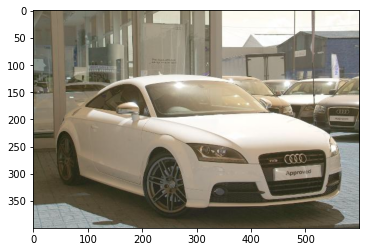

In [ ]:
# checking one random image
plt.imshow(cv2.imread("/content/drive/MyDrive/PGPAIML/Cars Images/00001.jpg"))
# image size 400x600

In [ ]:
# Loading the images into a list
folder_path= "/content/drive/MyDrive/PGPAIML/Cars Images"
image_list = os.listdir(folder_path)
train_images = []
for file in image_list:
  image_path = folder_path + "/"+ file
  train_images.append(cv2.imread(image_path))  


In [ ]:
# converting list to np array
train_arry = np.asarray(train_images)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


In [ ]:
# shape of the data set 
train_arry.shape
# 15 images, it seems each image if of different size 

(15,)

In [ ]:
for i in range(15):
  print("The shape of Image {} is {} ".format(i,train_arry[i].shape))


The shape of Image 0 is (424, 640, 3) 
The shape of Image 1 is (431, 575, 3) 
The shape of Image 2 is (600, 800, 3) 
The shape of Image 3 is (480, 639, 3) 
The shape of Image 4 is (108, 144, 3) 
The shape of Image 5 is (1386, 2100, 3) 
The shape of Image 6 is (843, 1280, 3) 
The shape of Image 7 is (335, 500, 3) 
The shape of Image 8 is (424, 640, 3) 
The shape of Image 9 is (480, 640, 3) 
The shape of Image 10 is (480, 640, 3) 
The shape of Image 11 is (675, 900, 3) 
The shape of Image 12 is (400, 600, 3) 
The shape of Image 13 is (480, 640, 3) 
The shape of Image 14 is (315, 500, 3) 


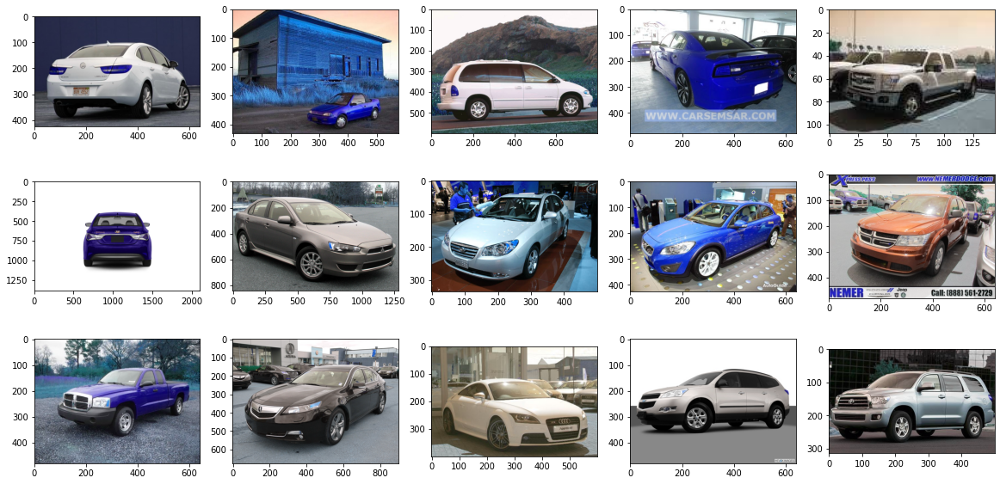

In [ ]:
plt.figure(figsize=(20,10))
for i in range(15):
  plt.subplot(3,5,i+1)
  plt.imshow(train_arry[i])

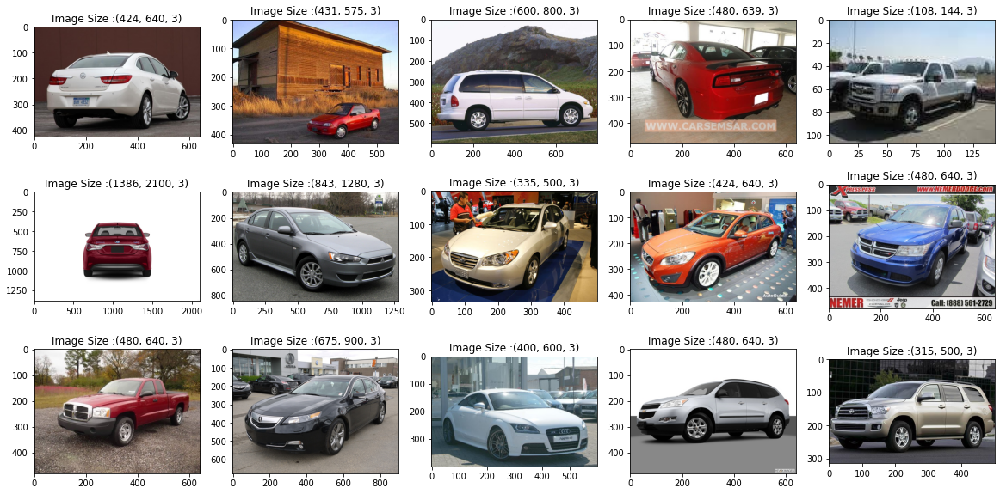

In [ ]:
# it seems the channel are not properly aligned when comparing the above output with that of input images
# aligning the channels and plotting accordingly
plt.figure(figsize=(20,10))
for i in range(15):
  b,g,r = cv2.split(train_arry[i])
  rgb_img = cv2.merge([r,g,b])
  plt.subplot(3,5,i+1)
  plt.imshow(rgb_img)
  plt.title("Image Size :"+str(rgb_img.shape))

In [ ]:
rgb_images = []
for i in range(15):
  b,g,r = cv2.split(train_arry[i])
  rgb_img = cv2.merge([r,g,b])
  rgb_images.append(rgb_img)

In [ ]:
rgb_arry = np.asarray(rgb_images)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


In [ ]:
car_make = []
car_type = []

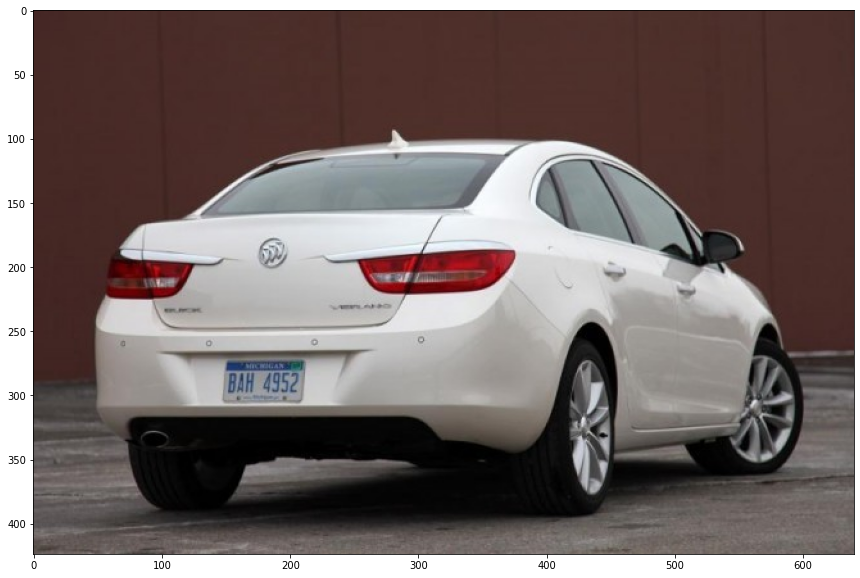

In [ ]:
# Diplaying each image again to checking the car make 
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[0])
# car type seems like sedan 

Text(0.5, 1.0, 'Gray Scale')

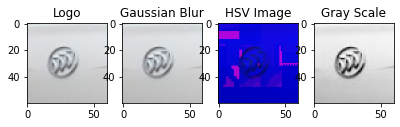

In [ ]:
# ectracting the logo from the image 
plt.figure(figsize=(10,5))
img = rgb_arry[0]
logo = img[160:220,160:220]
plt.subplot(161)
plt.imshow(logo)
plt.title("Logo")

# Gaussian Blur
logo_blur = cv2.GaussianBlur(logo,(1,1),1)
plt.subplot(162)
plt.imshow(logo_blur)
plt.title("Gaussian Blur")

# HSV Image
logo_hsv= cv2.cvtColor(logo_blur, cv2.COLOR_BGR2HSV) 
plt.subplot(163)
plt.imshow(logo_hsv)
plt.title("HSV Image")

# Gray Scale 
logo_grey = cv2.cvtColor(logo_blur, cv2.COLOR_BGR2GRAY)
plt.subplot(164)
plt.imshow(logo_grey,cmap="Greys_r")
plt.title("Gray Scale")

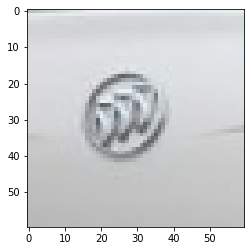

In [ ]:
logo_blur.shape
plt.imshow(logo_blur,cmap="Greys_r")
#logo_blur = np.mean(logo_blur,axis=2)

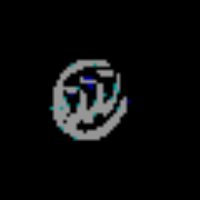

180.0


In [ ]:
# Binary threshold 
ret, logo_th1  = cv2.threshold(logo_blur,180,150,cv2.THRESH_BINARY_INV)
cv2_imshow(cv2.resize(logo_th1,(200,200)))
print(ret)

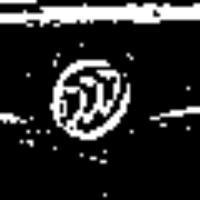

<Figure size 720x720 with 0 Axes>

In [ ]:
# Adaptive threshold
plt.figure(figsize=(10,10))
logo_th2 = cv2.adaptiveThreshold(logo_grey,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY_INV,11,2)
cv2_imshow(cv2.resize(logo_th2,(200,200)))


The car in the picture is a BUICK (company)carmake and a sedan

In [ ]:
car_make.append("Buick")
car_type.append("sedan")

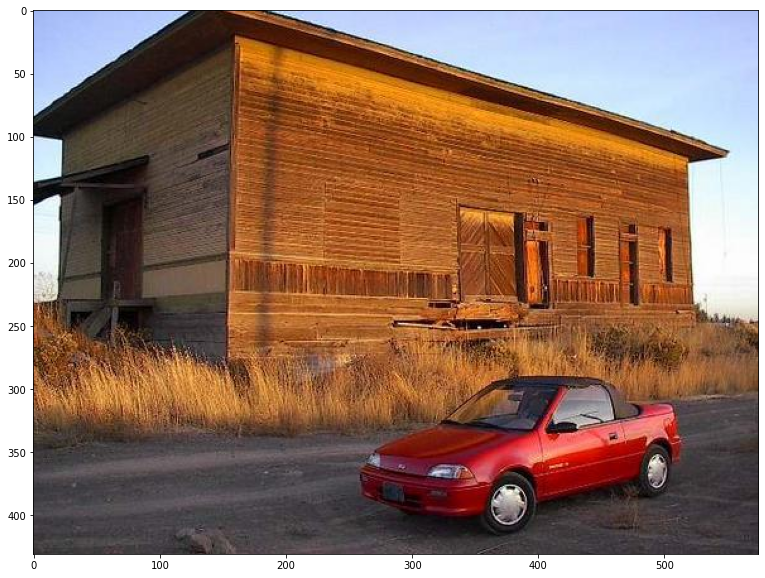

In [ ]:
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[1])
# car type seems like convertible 

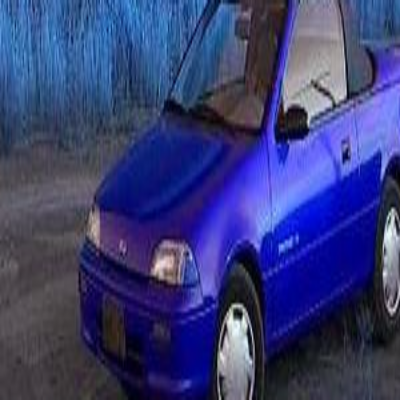

In [ ]:
# ectracting the image of the car from the image 
img = rgb_arry[1]
logo = img[300:400,200:500]
cv2_imshow(cv2.resize(logo,(400,400)))

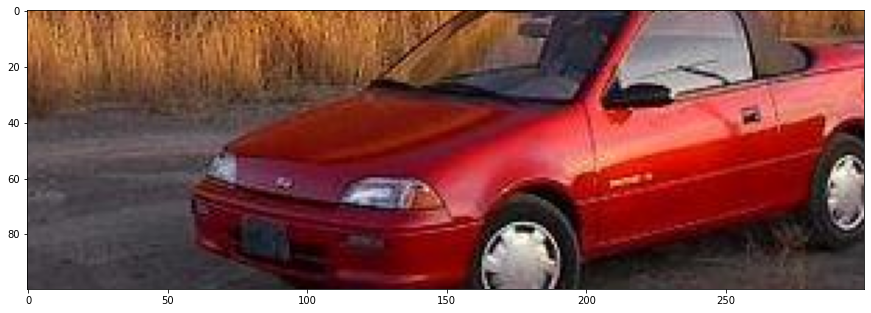

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(logo)

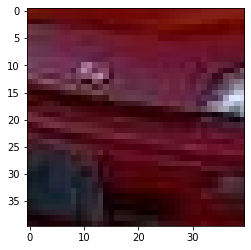

In [ ]:
img = logo
logo_2 = img[50:90,80:120]
#cv2_imshow(cv2.resize(logo,(400,400)))
plt.imshow(logo_2)

Text(0.5, 1.0, 'Gaussian Blur')

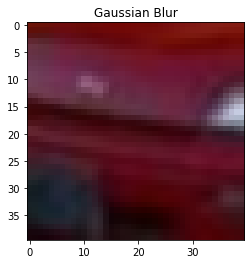

In [ ]:
# Gaussian Blur
# kernel 3x3
# standard deviation 1, tried other values but the logo is still not clear 
logo_blur_2 = cv2.GaussianBlur(logo_2,(3,3),1)
plt.imshow(logo_blur_2)
plt.title("Gaussian Blur")

Text(0.5, 1.0, 'Gray Scale')

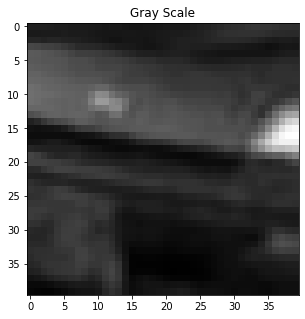

In [ ]:
# Gray Scale 
plt.figure(figsize=(5,5))
logo_grey_2 = cv2.cvtColor(logo_blur_2, cv2.COLOR_BGR2GRAY)
plt.subplot(111)
plt.imshow(logo_grey_2,cmap="Greys_r")
plt.title("Gray Scale")


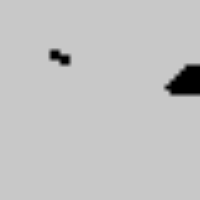

90.0


In [ ]:
# Binary threshold 
ret, logo_th1_2  = cv2.threshold(logo_grey_2,90,200,cv2.THRESH_BINARY_INV)
cv2_imshow(cv2.resize(logo_th1_2,(200,200)))
print(ret)

Not able to extract the logo from the image, trying for the text on the right side of the car, if possible 

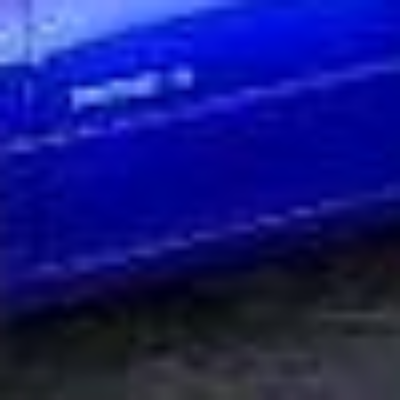

In [ ]:
img = rgb_arry[1]
text = img[350:400,400:450]
#plt.imshow(text)
cv2_imshow(cv2.resize(text,(400,400)))

Text also seems to be blurred, since the object of concern is small in overall image its difficult to arrive at the car make from the image, i did found out the car make from google though , its a Geo Automobile car make and a coupe, pusing the same values in data set 

In [ ]:
car_make.append("Geo automobile")
car_type.append("coupe")

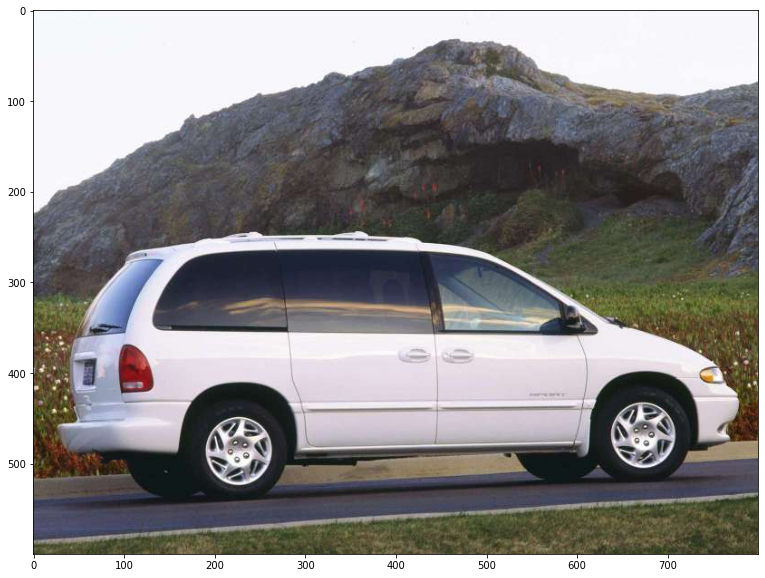

In [ ]:
# image 3 
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[2])
# car type is carvan 

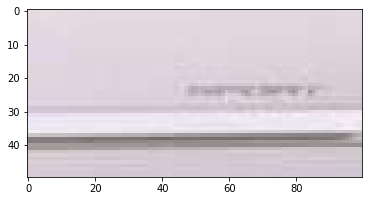

In [ ]:
# No logo on the car, extracting text on the driver seat
img = rgb_arry[2]
text_2 = img[400:450,500:600]
#cv2_imshow(cv2.resize(logo,(400,400)))
plt.imshow(text_2)

Text(0.5, 1.0, 'Gray Scale')

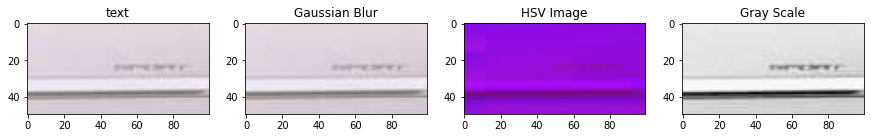

In [ ]:
# ectracting the logo from the image 
plt.figure(figsize=(15,15))
plt.subplot(141)
plt.imshow(text_2)
plt.title("text")

# Gaussian Blur
text_2_blur = cv2.GaussianBlur(text_2,(1,1),1)
plt.subplot(142)
plt.imshow(text_2_blur)
plt.title("Gaussian Blur")

# HSV Image
text_2_hsv= cv2.cvtColor(text_2_blur, cv2.COLOR_BGR2HSV) 
plt.subplot(143)
plt.imshow(text_2_hsv)
plt.title("HSV Image")

# Gray Scale 
text_2_grey = cv2.cvtColor(text_2_blur, cv2.COLOR_BGR2GRAY)
plt.subplot(144)
plt.imshow(text_2_grey,cmap="Greys_r")
plt.title("Gray Scale")

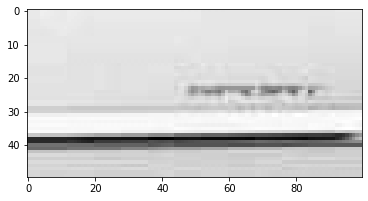

In [ ]:
plt.imshow(text_2_grey,cmap="Greys_r")

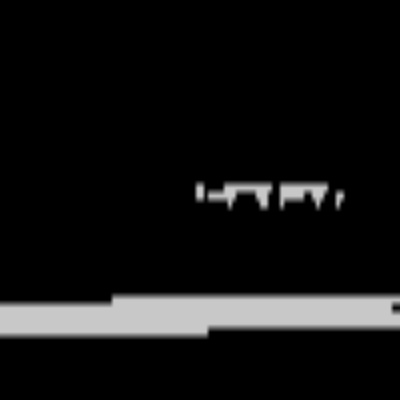

180.0


In [ ]:
# Global threshold 
ret, text_2_th1  = cv2.threshold(text_2_grey,180,200,cv2.THRESH_BINARY_INV)
cv2_imshow(cv2.resize(text_2_th1,(400,400)))
print(ret)

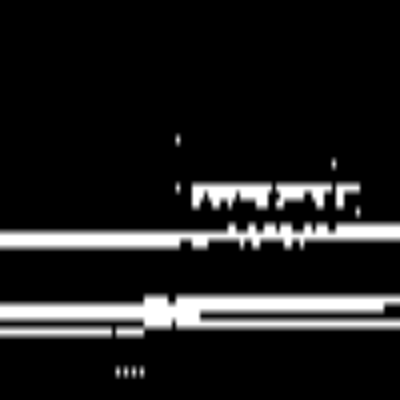

In [ ]:
# Adaptive threshold
#plt.figure(figsize=(10,10))
text_2_th2 = cv2.adaptiveThreshold(text_2_grey,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY_INV,5,6)
cv2_imshow(cv2.resize(text_2_th2,(400,400)))


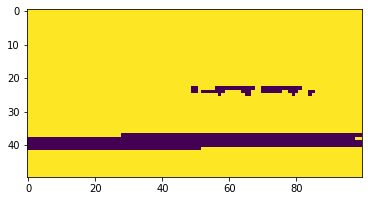

In [ ]:
# Otsu's thresholding
ret2,th2 = cv2.threshold(text_2_grey,0,225,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(th2)

After tryin different methods of filter out the text it seems the image resolution is too small to check the details of the car in the picture, car make is DODGE and cartype is carvan, source google, pushing the same in data 

In [ ]:
car_make.append("Dodge")
car_type.append("carvan")

Text(0.5, 1.0, 'shape (480, 639, 3)')

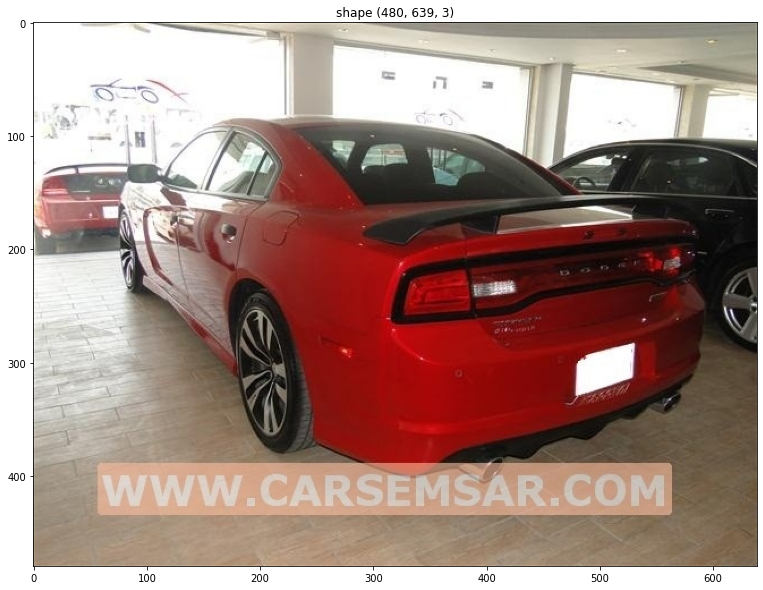

In [ ]:
# image 4 
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[3])
plt.title("shape {}".format(rgb_arry[3].shape))

In [ ]:
img = cv2.resize(cv2.rotate(cv2.flip(rgb_images[3],1),cv2.ROTATE_90_COUNTERCLOCKWISE),(800,800))

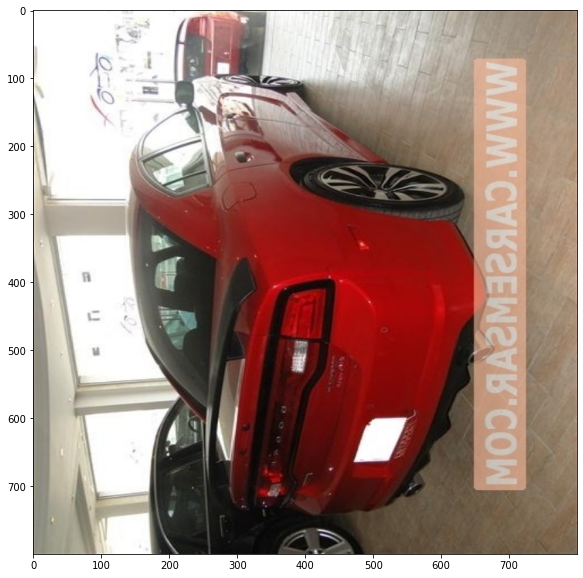

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(img)

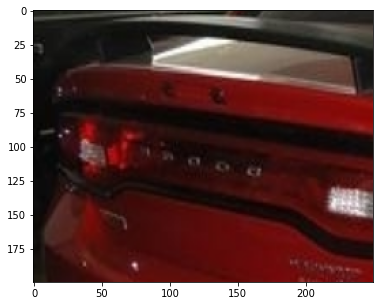

In [ ]:
# ectracting the back from the image 
plt.figure(figsize=(10,5))
back = img[500:750,250:450]
back = cv2.rotate(back,cv2.ROTATE_90_CLOCKWISE)
plt.imshow(back)

Text(0.5, 1.0, 'Gaussian Blur')

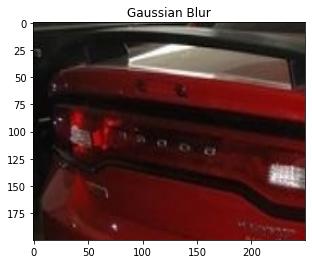

In [ ]:
# Gaussian Blur
back_blur = cv2.GaussianBlur(back,(1,1),1)
plt.imshow(back_blur)
plt.title("Gaussian Blur")

Text(0.5, 1.0, 'Gray Scale')

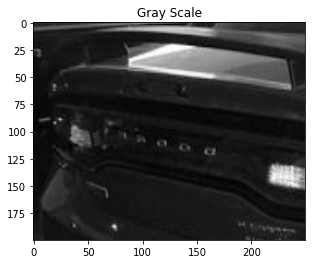

In [ ]:
# Gray Scale 
back_grey = cv2.cvtColor(back, cv2.COLOR_BGR2GRAY)
plt.imshow(back_grey,cmap="Greys_r")
plt.title("Gray Scale")

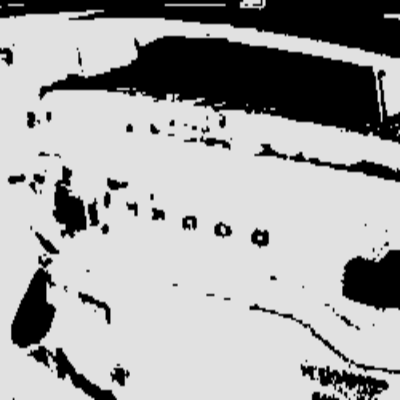

30.0


In [ ]:
# Global threshold 
ret, back_th1  = cv2.threshold(back_grey,30,225,cv2.THRESH_BINARY_INV)
cv2_imshow(cv2.resize(back_th1,(400,400)))
print(ret)

The above car in the image is DODGE as per binary thresholding
verified from google, adding it to the data set 

In [ ]:
car_make.append("DODGE")
car_type.append("Sedan")

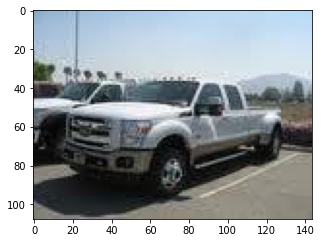

In [ ]:
# Image 5 
plt.figure(figsize=(5,5))
plt.imshow(rgb_arry[4])
# seems like a ford truck, image resolution too samll to do any operation 

seems like a ford truck, image resolution too samll to do any operation 
pushing the same data to the data set 

In [ ]:
car_make.append("FORD")
car_type.append("Truck")

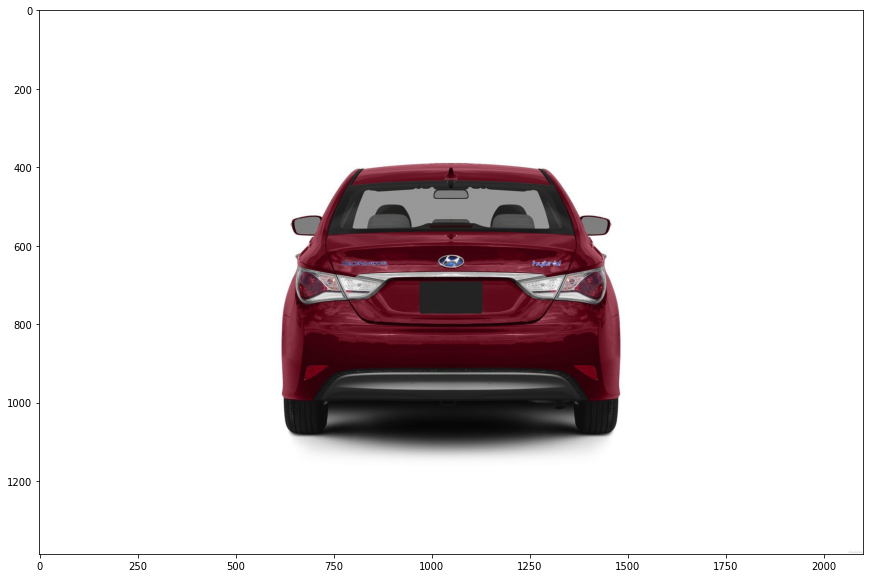

In [ ]:
# Image 6 
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[5])


The image is clear, the car is a hyundai sedan 

In [ ]:
car_make.append("Hyundai")
car_type.append("Sedan")

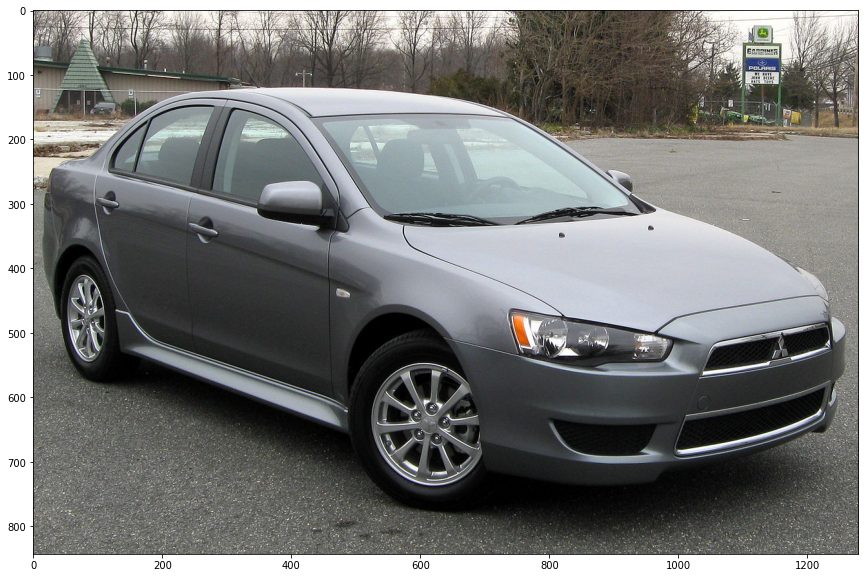

In [ ]:
# Image 7 
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[6])


mitsubishi, from the brand logo and car type is sedan 

In [ ]:
car_make.append("Mitsubishi")
car_type.append("Sedan")

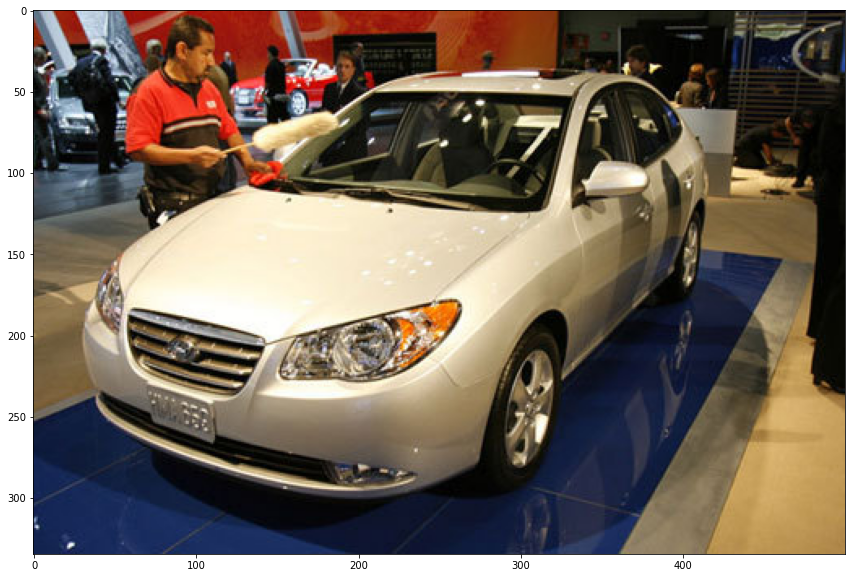

In [ ]:
# Image 8
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[7])


Hyundai sedan , the image is clear 

In [ ]:
car_make.append("Hyundai")
car_type.append("Sedan")

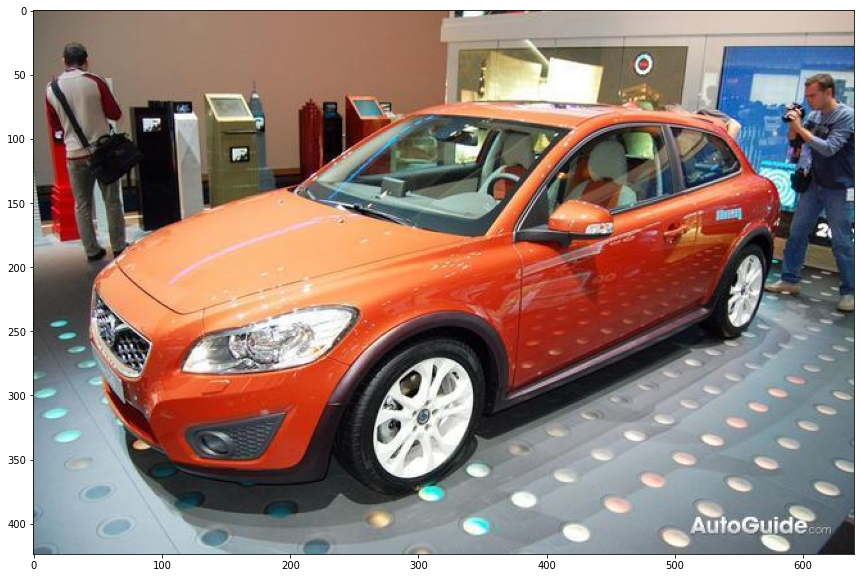

In [ ]:
# Image 9 
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[8])
# seem like a nissan car make 

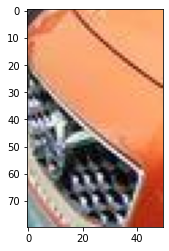

In [ ]:
# selecting the region of interest  
img = rgb_arry[8]
logo = img[200:280, 50:100]
plt.imshow(logo)


Text(0.5, 1.0, 'Gray Scale')

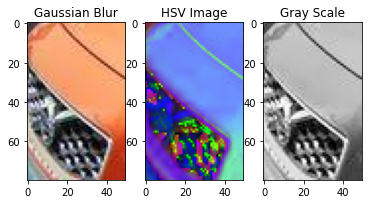

In [ ]:
# Gaussian Blur
logo_blur = cv2.GaussianBlur(logo,(1,1),1)
plt.subplot(131)
plt.imshow(logo_blur)
plt.title("Gaussian Blur")

# HSV Image
logo_hsv= cv2.cvtColor(logo_blur, cv2.COLOR_BGR2HSV) 
plt.subplot(132)
plt.imshow(logo_hsv)
plt.title("HSV Image")

# Gray Scale 
logo_grey = cv2.cvtColor(logo_blur, cv2.COLOR_BGR2GRAY)
plt.subplot(133)
plt.imshow(logo_grey,cmap="Greys_r")
plt.title("Gray Scale")

Nissan , hatch back 

In [ ]:
car_make.append("Nissar")
car_type.append("Hatchback")

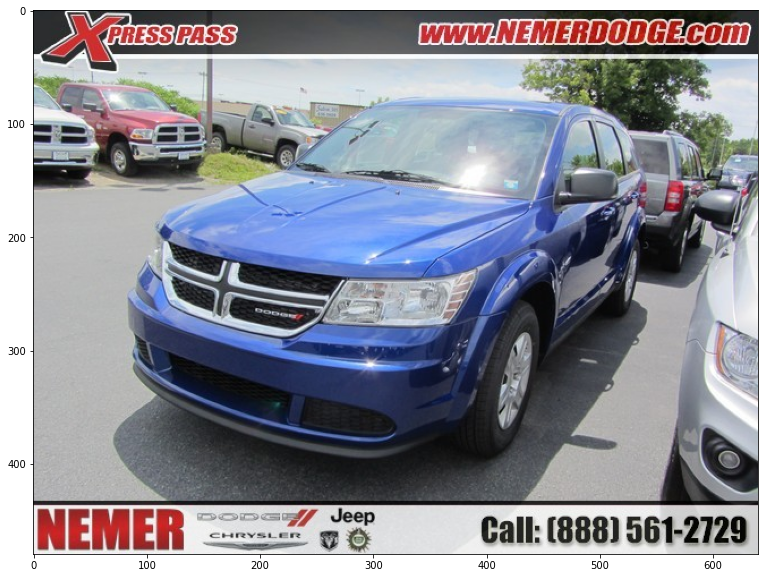

In [ ]:
# Image 10 
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[9])


Clear from the image , its a dodge SUV

In [ ]:
car_make.append("DODGE")
car_type.append("SUV")

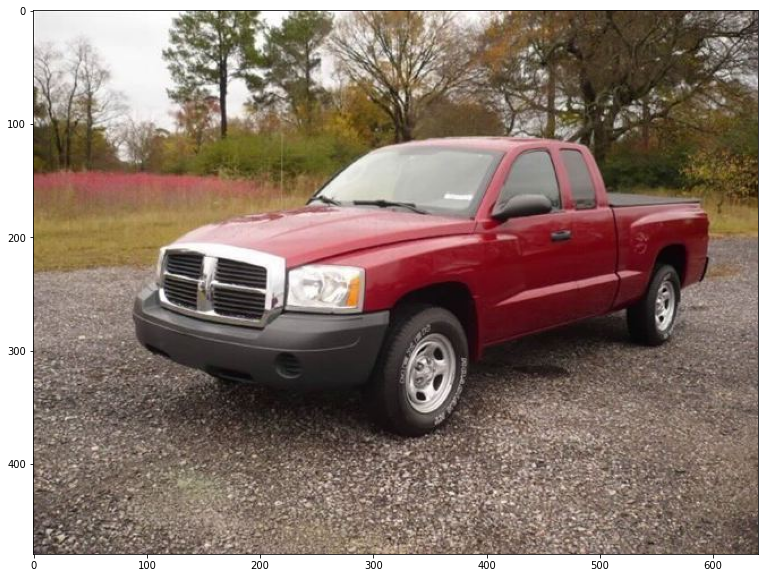

In [ ]:
# Image 11 
plt.figure(figsize=(15,10))
plt.imshow(rgb_arry[10])


# Challenges


1.   The images do not have a clear brang logo to label them for identification
2.   Some images has a side view of a car hence not sure how to label them 
3.   Some are labelled with website as well 
4.   some has very small resolution difficult to look for data and details 
5.   Car_make and Car_type are the final output lists for the provided car images. 
